## About Dataset
Since 2008, guests and hosts have used Airbnb to expand on traveling possibilities and present more unique, personalized way of experiencing the world. This dataset describes the listing activity and metrics in London UK in 2022.

## Goals
In my work I wanted to find answers on the following questions:

* Are there any significant correlation between quantitative metrics?
* What are the most popular room types?
* What are the most popular neighbourhoods?
* How does the price change depending on room type and neighbourhood?
* How does the number of reviews change depending on room type and neighbourhood?
* What type of property dominates in each neighbourhood?
* How does the availability change depending on room type and neighbourhood?
* How does the hosts' listings count change depending on room type and neighbourhood?
* How many hosts have different types of property?

## Data Preparation

In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from IPython.display import Image

In [2]:
# Importing the listing dataset
df = pd.read_csv('dataset/listings.csv')
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,714569379355913481,Lovely private bedroom in Muswell Hill.,39009854,Forough,NaN,Haringey,51.597280,-0.139330,Private room,100,1,0,NaN,NaN,1,365,0,NaN
1,822557738577472503,PropertyPlug - 2Bed Flat in Edgware SmartTV WiFi,325629338,Paul,NaN,Harrow,51.608180,-0.277400,Entire home/apt,132,2,0,NaN,NaN,4,35,0,NaN
2,4876550,Stunning Apartment 2 minutes walk to Tube Station,25087384,Joseph,NaN,Barnet,51.602282,-0.193606,Entire home/apt,120,5,0,NaN,NaN,1,337,0,NaN
3,786791705194673775,Waddon Coach House 2,490795350,Jahmal,NaN,Croydon,51.370691,-0.109956,Entire home/apt,100,2,6,2023-03-09,3.83,24,252,6,NaN
4,808038970516277767,Studio Flat Franklin London,495977998,Hussein,NaN,Barnet,51.636518,-0.177475,Entire home/apt,65,180,0,NaN,NaN,7,365,0,NaN


In [3]:
df.shape

(75241, 18)

In [4]:
df.isnull().sum()

id                                    0
name                                 31
host_id                               0
host_name                             5
neighbourhood_group               75241
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       18693
reviews_per_month                 18693
calculated_host_listings_count        0
availability_365                      0
number_of_reviews_ltm                 0
license                           75241
dtype: int64

I'll delete some columns that aren't useful for my analysis.

There are neighbouhood_group and license, as these two columns are empty.



Also I'll delete host_name. This information could be useful, if I wanted to check if host's gender has influence on occupancy. But now I'll use only host_id to identify hosts.

Finally, there are three similar metrics - reviews_per_month, number_of_reviews and number_of_reviews_ltm. I'll keep only the last one. In my opinion, it's more appropriate because it shows number of reviews for the same period of time (last 12 months). And in reviews_per_month there are almost 17 000 empty values.

In [5]:
df.drop(['host_name', 'neighbourhood_group', 'number_of_reviews', 'reviews_per_month', 'license'], 
        axis=1, inplace=True)

# Also, I will change the type of data for last-review from object to datetime.
df['last_review'] = pd.to_datetime(df['last_review'])

df.head()

,id,name,host_id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,last_review,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,714569379355913481,Lovely private bedroom in Muswell Hill.,39009854,Haringey,51.597280,-0.139330,Private room,100,1,NaT,1,365,0
1,822557738577472503,PropertyPlug - 2Bed Flat in Edgware SmartTV WiFi,325629338,Harrow,51.608180,-0.277400,Entire home/apt,132,2,NaT,4,35,0
2,4876550,Stunning Apartment 2 minutes walk to Tube Station,25087384,Barnet,51.602282,-0.193606,Entire home/apt,120,5,NaT,1,337,0
3,786791705194673775,Waddon Coach House 2,490795350,Croydon,51.370691,-0.109956,Entire home/apt,100,2,2023-03-09,24,252,6
4,808038970516277767,Studio Flat Franklin London,495977998,Barnet,51.636518,-0.177475,Entire home/apt,65,180,NaT,7,365,0


## Exploratory data analysis

### What are the most popular room types?

In [6]:
df['room_type'].value_counts()

Entire home/apt    45714
Private room       28910
Shared room          403
Hotel room           214
Name: room_type, dtype: int64

Two categories - Entire home/apt (45,714 listings) and Private room (28,910 listings) - dominate the market, while Shared room (403 listings) and Hotel room (214 listings) aren't popular.

### What are the most popular neighbourhoods?

In [7]:
df['neighbourhood'].value_counts()

Westminster               8550
Tower Hamlets             6083
Hackney                   5490
Kensington and Chelsea    4959
Camden                    4943
Southwark                 4278
Lambeth                   4170
Islington                 4142
Wandsworth                3701
Hammersmith and Fulham    3260
Brent                     2366
Lewisham                  2184
Haringey                  2033
Newham                    1905
Ealing                    1899
Barnet                    1788
Greenwich                 1670
Waltham Forest            1428
Croydon                   1242
Merton                    1219
Richmond upon Thames      1092
Hounslow                  1083
Hillingdon                 719
Redbridge                  704
Enfield                    687
Bromley                    643
Kingston upon Thames       571
Barking and Dagenham       475
Harrow                     449
City of London             445
Bexley                     412
Havering                   341
Sutton  

In [8]:
fig = px.histogram(
    df,
    x='neighbourhood',
    text_auto=True,
    title='Number of listings by neighbourhoods',
    height=600
    )
fig.update_xaxes(
    categoryorder='total descending',
    tickangle=45
    )
fig.update_traces(textposition='outside')

fig.show()

No surprise that the most popular neighboorhoods are located in the centre of London. The confident leader is Westminster (8550 listings). The only exception is the City of London (445 listings) because it is the smallest neighbourhood and there you can't find many residential properties. The least popular is Sutton (310 listings).

### Are there any significant correlation between quantitative metrics?

In [9]:
# For the start, a closer look at the data.
# Values for id and host_id will have no sense, so I don't want to see them.
df_without_id = df.drop(['id','host_id'], axis=1)

df_without_id.describe()

,latitude,longitude,price,minimum_nights,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,75241.000000,75241.000000,75241.000000,75241.000000,75241.000000,75241.000000,75241.000000
mean,51.509708,-0.128108,175.734453,5.750748,15.756689,113.073896,5.736301
std,0.048369,0.099341,487.362025,24.240947,55.537579,132.687784,12.991805
min,51.295937,-0.497800,0.000000,1.000000,1.000000,0.000000,0.000000
25%,51.483540,-0.189390,60.000000,1.000000,1.000000,0.000000,0.000000
50%,51.513840,-0.126280,100.000000,2.000000,1.000000,47.000000,0.000000
75%,51.539450,-0.068460,180.000000,4.000000,5.000000,228.000000,6.000000
max,51.681142,0.288570,70111.000000,1125.000000,501.000000,365.000000,564.000000


For all categories we can see a significant difference between average and median values. It means that values of small share of listings can distort the overall picture.

For example, the average price is 175 pounds/night but 50% of listings are cheaper than 100 pounds/night. The reason of this disproportion is that there are some very expensive property (maximum price is 70,111 pounds/night).

That's why it will be better to analyze median values instead of average where it's more appropriate.

C:\Users\Zaan\AppData\Local\Temp\ipykernel_7216\3357235876.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



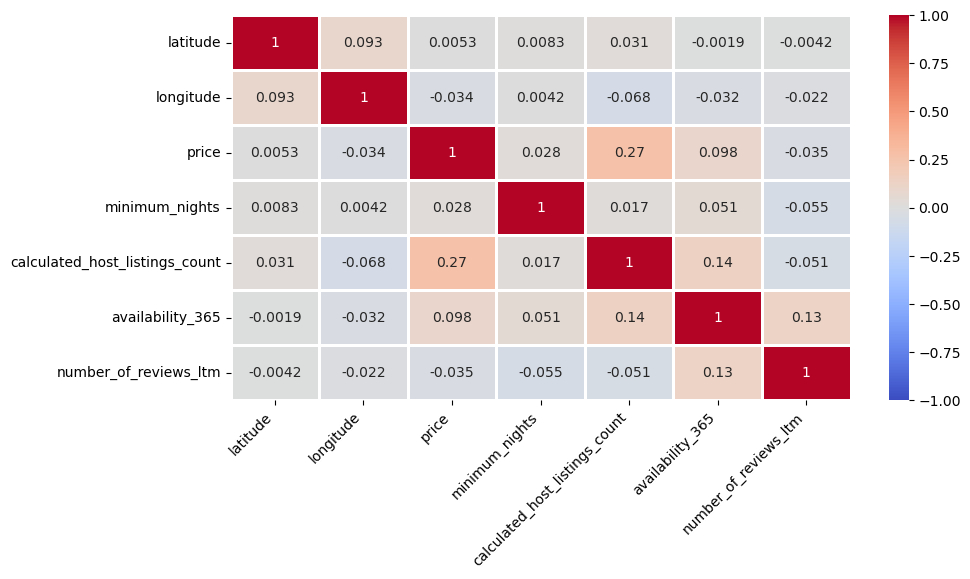

In [10]:
# Finally, let's check if there is correlation between quantitative data.
df_corr = df_without_id.corr()

fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(df_corr, annot=True, vmin=-1, vmax=1, center= 0, linewidths=1, cmap='coolwarm')
plt.xticks(rotation=45, ha='right');

As you can see above, there's no significant correlation between data.

### How does the price change depending on room type?

In [11]:
How does the price change depending on room type?
# Let's look at how the median price depends on the type of property.
median_price_by_room_type = df.pivot_table(
    values='price',
    index='room_type',
    aggfunc='median',
    fill_value=0
).sort_values(by='price', ascending=False)


fig = px.bar(
    median_price_by_room_type,
    text_auto=True,
    title='Median price by room type'
)

fig.show()

As you remember, Shared room and Hotel room are significantly less popular than the other two categories. I suppose that it can be partly explained by their price.

Usually hotel rooms (213 pounds/night) are more expensive than entire homes/apartments (150 pounds/night). Also, the latter can be a more advantageous option (especially, in terms of price per person) for a group of travelers - friends or family.

As for shared rooms, they are clearly the cheapest - median price 41 pounds/night against 52 pounds/night for private rooms. But I suppose that a lot of people prefer to pay a little bit more to have private space. Anyway, even with the lowest price there aren't many such listings on the market.

### How does the price change depending on neighbourhood?

In [12]:
# Let's look at how the median price depends on the neighbourhood.
median_price_by_neighbourhood = df.pivot_table(
    index='neighbourhood',
    values='price',
    aggfunc='median',
    fill_value=0
).sort_values(by='price', ascending=False)


fig = px.bar(
    median_price_by_neighbourhood,
    text_auto='d',
    title='Median price by neighbourhood'
)

fig.show()

The most central neighbourhoods are on top in terms of price, like it was with the distribution of quantity of listings by the neighbourhoods. But then we could see clearly the leader and Top-10 neighbourhoods. Let's look how it will be this time.

There are three much more expensive neighbourhoods than the others: City of London (175 pounds/night), Kensigton and Chelsea (179 pounds/night), Westminster (179 pounds/night).

Below Top-3 the difference is rather smooth.

Also, there are only five neighbourhoods where the median price is higher than those for the whole London (100 pounds/night). So there are a lot of options to save traveler's budget.

### How does the number of reviews change depending on neighbourhood?

In [13]:
fig = px.histogram(
    df, 
    x='neighbourhood', 
    y='number_of_reviews_ltm',
    histfunc='avg',
    text_auto='.1f',
    title='Average number of reviews by neighbourhood for last 12 months'
)
fig.update_xaxes(categoryorder='total descending')

fig.show()

There are two surprising results for me.

* City of London is the clear leader with almost 10 reviews/listing while it has only 445 listings (4th rank from the end).
* Camden - on the other hand popular neighbourhood with only 4943 listings - is on the 2nd place with8.4 reviews/listings.
Likewise, it can be explained by the fact that more popular neighbourhoods may have many inactive listings without reviews. It can lower average value of the metric.

Unfortunately, we don't have information about character of the reviews, whether they are positive or negative. So we can't evaluate customer satisfaction by these numbers.

### How does the number of reviews change depending on room type?

In [14]:
fig = px.histogram(
    df,
    x='room_type',
    y='number_of_reviews_ltm',
    histfunc='avg',
    text_auto='.1f',
    title='Average number of reviews by room type for last 12 months'
)
fig.update_xaxes(categoryorder='total descending')

fig.show()

For the same reason, this result was also a little bit surprising for me at the first sight.

But the median value for number of reviews for last 12 months for all listings is 0.

So apparently the lower values for Entire home/apt and Private room are explained by the fact that in these categories there are much more listings with no reviews than for Hotel room and Shared room.

### What type of property dominates in each neighbourhood? 
Let's look where it's easier to find an available property and what type of property it will be.

First of all, I want to know how many properties of each type we can find in each neighbourhood

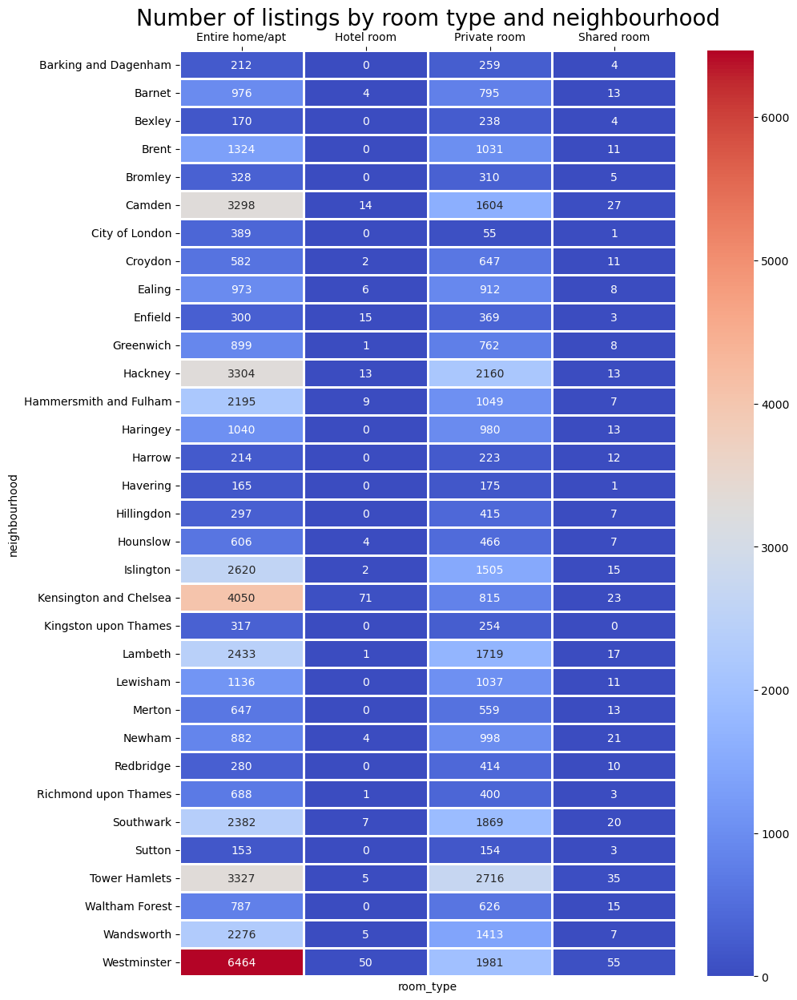

In [15]:
room_type_by_neighbourhood = df.pivot_table(
    index='neighbourhood',
    columns='room_type',
    values='id',
    aggfunc='count',
    fill_value=0
)


fig, ax = plt.subplots(figsize=(10,15))
sns.heatmap(
    room_type_by_neighbourhood, 
    annot=True,
    fmt='d', 
    linewidths=1,
    cmap='coolwarm'
)
ax.xaxis.tick_top()
plt.title('Number of listings by room type and neighbourhood', fontsize = 20);

In [16]:
# Let's count number of neighbourhoods where dominates 'Entire home/apt' or 'Private room'
# and number of neighbourhoods without hoel rooms.
entire_count = 0
private_count = 0
equal_count = 0
no_hotel_count = 0

for i in range(len(room_type_by_neighbourhood)):
    if room_type_by_neighbourhood['Entire home/apt'][i] > room_type_by_neighbourhood['Private room'][i]:
        entire_count += 1
    elif room_type_by_neighbourhood['Entire home/apt'][i] < room_type_by_neighbourhood['Private room'][i]:
        private_count += 1
    else:
        equal_count += 1
        
for i in range(len(room_type_by_neighbourhood)):
    if room_type_by_neighbourhood['Hotel room'][i] == 0:
        no_hotel_count += 1
        
print(f'Number of neighbourhoods where dominates Entire home/apt - {entire_count}')
print(f'Number of neighbourhoods where dominates Private room - {private_count}')
print(f'Number of neighbourhoods with equal quantity of Entire home/apt and  Private room - {equal_count}')
print(f'Number of neighbourhoods without Hotel room - {no_hotel_count}')

Number of neighbourhoods where dominates Entire home/apt - 23
Number of neighbourhoods where dominates Private room - 10
Number of neighbourhoods with equal quantity of Entire home/apt and  Private room - 0
Number of neighbourhoods without Hotel room - 15


As you remember, Entire home/apt (45714 listings) and Private room (28910 listings) dominate the market. While in general there are much more Entire home/apt listings, this category is the leader only in 23 of 33 neighbourhoods. In the other 10 neighbourhoods the leading category is Private room.

Also, there are 15 neighbourhoods without hotel rooms at all.

### How does the availability change depending on room type?

In [17]:
median_availability_by_room_type = df.pivot_table(
    index='room_type',
    values='availability_365',
    aggfunc='median',
    fill_value=0
).sort_values(by='availability_365', ascending=False)


fig = px.bar(
    median_availability_by_room_type,
    text_auto=True,
    title='Median availability by room type'
)

fig.show()

These results are reasonable.

Usually hotel rooms are available for booking most days of the year (276.5 in our case).

If people live in their property, they can't rent entire property or a private room very often. So 50% of entire homes/apartments are available less than 56 days per year, 50% of private rooms - less than 31 days per year.

Shared rooms looks more available. Half of them can be booked more than 88 days per year.

### How does the availability change depending on neighbourhood?

In [18]:
median_availabilty_by_neighbourhood = df.pivot_table(
    index='neighbourhood',
    values='availability_365',
    aggfunc='median',
    fill_value=0
).sort_values(by='availability_365', ascending=False)


fig = px.bar(
    median_availabilty_by_neighbourhood,
    text_auto='d',
    title='Median availability by neighbourhood'
)

fig.show()

There is only one location; Hackney where 50% of listings aren't available at all. That's rather strange. For example, in Hackney there are around 3304 entire homes/apartments and around 2160 private rooms. Maybe many of these listings aren't active anymore or there's some mistake in data.

Surprisingly, two leaders are Bexley and Hillingdon. There aren't hotel rooms which typically are the most available. But 50% of entire homes/apartments (median more than 228 days per year) and private rooms (median more than 172 days per year) in these areas are very available (look at the plot below). So we can suppose that their hosts actively use this property as a source of passive income while they live somewhere else.

These are just two insights. I believe that closer look at availability in each neighbourhood can reveale a lot of intresting information about the structure of Airbnb market in London.

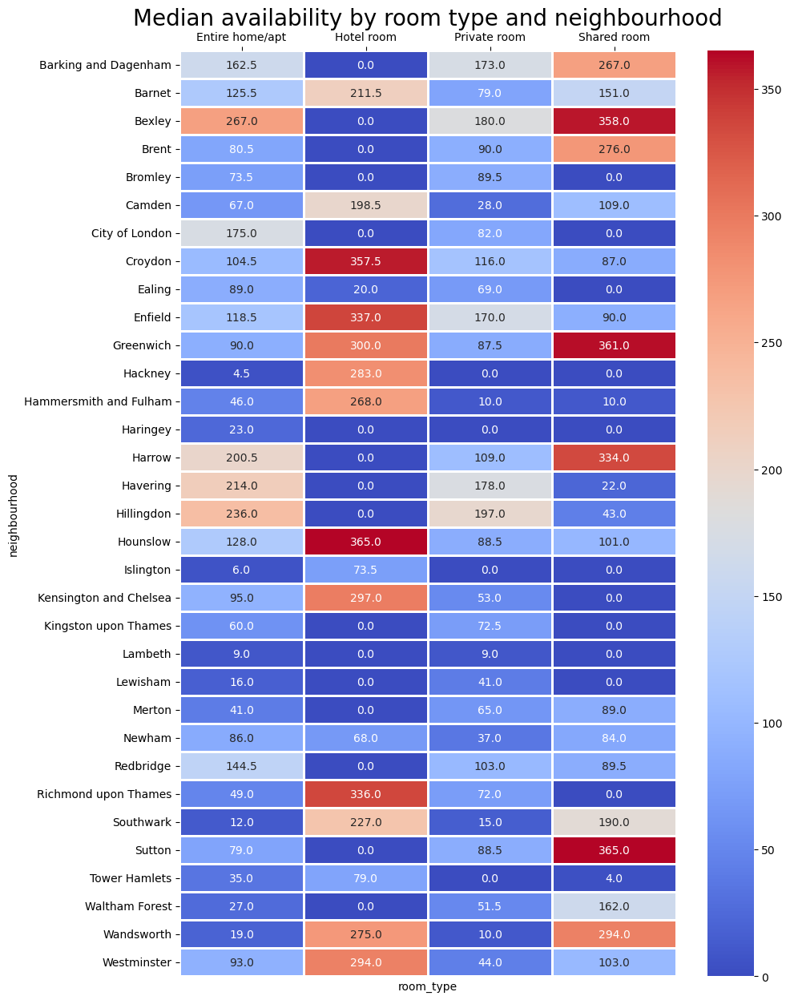

In [19]:
median_availabilty_by_room_and_neighbourhood = df.pivot_table(
    index='neighbourhood',
    columns='room_type',
    values='availability_365',
    aggfunc='median',
    fill_value=0
)


fig, ax = plt.subplots(figsize=(10,15))
sns.heatmap(
    median_availabilty_by_room_and_neighbourhood, 
    annot=True,
    fmt='.1f', 
    linewidths=1,
    cmap='coolwarm'
)
ax.xaxis.tick_top()
plt.title('Median availability by room type and neighbourhood', fontsize = 20);

Many zeros in Hotel room category can be explained by the fact that there are no such listings in many neighbourhoods. Zeros in other categories are less comprehensible. A more detailed analysis is needed to find the reason.

More than 50% Shared room listings in some peripheral neighbourhoods are available most days of the year. That means that their hosts actively look for an addititional income.

There are only four neighbourhoods for Entire home/apt listings and no neighbourhoods for Private room listings where median availability is above 200 days per year.

Also, we can note that in two popular and expensive neighbourhoods - Westminster, Kensington and Chelsea - half of the Entire home/apt listings are available less than 95 days per year and Private room listings are available less than 53 days per year. So, it can be easier to find a hotel room if you want to stay there.

### How does the hosts' listings count change depending on room type?

Above I started to make suggestions about the hosts' portraits. Now let's dive deeper in this field.

In [20]:
median_host_listings_count_by_room_type = df.pivot_table(
    index='room_type',
    values='calculated_host_listings_count',
    aggfunc='median',
    fill_value=0
).sort_values(by='calculated_host_listings_count', ascending=False)

mean_host_listings_count_by_room_type = df.pivot_table(
    index='room_type',
    values='calculated_host_listings_count',
    aggfunc='mean',
    fill_value=0
).sort_values(by='calculated_host_listings_count', ascending=False)

fig = make_subplots(
    rows=1, 
    cols=2, 
    shared_yaxes=True, 
    subplot_titles=("Median host listings count by room type", "Average host listings count by room type")
)

fig.add_trace(
    go.Bar(
        x=median_host_listings_count_by_room_type.index, 
        y=median_host_listings_count_by_room_type['calculated_host_listings_count'],
        showlegend=False,
        text=median_host_listings_count_by_room_type['calculated_host_listings_count'],
        textposition='outside'
    ), 
    1, 1
)

fig.add_trace(
    go.Bar(
        x=mean_host_listings_count_by_room_type.index, 
        y=mean_host_listings_count_by_room_type['calculated_host_listings_count'],
        text=mean_host_listings_count_by_room_type['calculated_host_listings_count'],
        showlegend=False,
        textfont=dict(color='white'),
        textposition='inside',
        texttemplate='%{y:.1f}'
    ), 
    1, 2
)

fig.show()

Most hosts are small players on the market. Half of Entire home/apt and Private room hosts have only 1 listing, half of Shared room hosts - 1 listings. Even in Hotel room category 50% of hosts have only 6 listings.

On the other hand, there are also large players. That's why average values are much bigger. In Hotel room category - 45.5 listings/host, in Entire home/apt - 19.7 listings/host, in Private room - 9.4 listings/host, in Shared room - 4.2 listings/host.

Note! It doesn't mean that each host has listings only in one category. It's possible that some of them rent different types of property. We can check it.

### How many hosts have different types of property?

In [21]:
# At first we should find hosts of different types of property.
hotel_room_hosts = set()
entire_home_hosts = set()
private_room_hosts = set()
shared_room_hosts = set()

# As we dont't have null values in our dataframe, we can use this loop.
for i in range(len(df['host_id'])):
    if df['room_type'].loc[i] == 'Hotel room':
        hotel_room_hosts.add(df['host_id'].loc[i])
    elif df['room_type'].loc[i] == 'Entire home/apt':
        entire_home_hosts.add(df['host_id'].loc[i])
    elif df['room_type'].loc[i] == 'Private room':
        private_room_hosts.add(df['host_id'].loc[i])
    else:
        shared_room_hosts.add(df['host_id'].loc[i])
# Let's find how many hosts have different types of listings.
print('Entire home/apt hosts count -', len(entire_home_hosts))
print('Private room hosts count - ', len(private_room_hosts))
print('Shared room hosts count - ', len(shared_room_hosts))
print('Hotel room hosts count -', len(hotel_room_hosts))
print('')
print('Only entire home/apt hosts count -', len(
    ((entire_home_hosts.difference(
        hotel_room_hosts)).difference(
            private_room_hosts)).difference(shared_room_hosts)))
print('Only private room hosts count -', len(
    ((private_room_hosts.difference(
        hotel_room_hosts)).difference(
            entire_home_hosts)).difference(shared_room_hosts)))
print('Only shared room hosts count -', len(
    ((shared_room_hosts.difference(
        hotel_room_hosts)).difference(
            entire_home_hosts)).difference(private_room_hosts)))
print('Only hotel room hosts count -', len(
    ((hotel_room_hosts.difference(
        entire_home_hosts)).difference(
            private_room_hosts)).difference(shared_room_hosts)))
print('')
print('Entrire home/apt & Private room hosts count -', len(entire_home_hosts.intersection(private_room_hosts)))
print('Entrire home/apt & Shared room hosts count -', len(entire_home_hosts.intersection(shared_room_hosts)))
print('Entrire home/apt & Hotel room hosts count -', len(entire_home_hosts.intersection(hotel_room_hosts)))
print('Private & Shared room hosts count -', len(private_room_hosts.intersection(shared_room_hosts)))
print('Private & Hotel room hosts count -', len(private_room_hosts.intersection(hotel_room_hosts)))
print('Shared room & Hotel room hosts count -', len(shared_room_hosts.intersection(hotel_room_hosts)))
print('')
print('Entrire home/apt & Private room & Shared room hosts count -', len(
    (entire_home_hosts.intersection(
        private_room_hosts)).intersection(shared_room_hosts)))
print('Entrire home/apt & Private room & Hotel room hosts count -', len(
    (entire_home_hosts.intersection(
        private_room_hosts)).intersection(hotel_room_hosts)))
print('Entrire home/apt & Shared room & Hotel room hosts count -', len(
    (entire_home_hosts.intersection(
        shared_room_hosts)).intersection(hotel_room_hosts)))
print('Private room & Shared room & Hotel room hosts count -', len(
    (hotel_room_hosts.intersection(
        private_room_hosts)).intersection(shared_room_hosts)))

Entire home/apt hosts count - 29273
Private room hosts count -  20734
Shared room hosts count -  321
Hotel room hosts count - 71

Only entire home/apt hosts count - 26597
Only private room hosts count - 18007
Only shared room hosts count - 218
Only hotel room hosts count - 41

Entrire home/apt & Private room hosts count - 2649
Entrire home/apt & Shared room hosts count - 38
Entrire home/apt & Hotel room hosts count - 12
Private & Shared room hosts count - 80
Private & Hotel room hosts count - 22
Shared room & Hotel room hosts count - 3

Entrire home/apt & Private room & Shared room hosts count - 17
Entrire home/apt & Private room & Hotel room hosts count - 6
Entrire home/apt & Shared room & Hotel room hosts count - 0
Private room & Shared room & Hotel room hosts count - 1


* More than 90% of 29273 Entire home/apt hosts rent only this type of property.
* More than 86% of 20734 Private room hosts rent only this type of property.
* More than 67% of 321 Shared room hosts rent only this type of property.
* More than 57% of 71 Hotel room hosts rent only this type of property.
* 2649 hosts rent Entire home/apt and Private room listings.


### How does the hosts' listings count change depending on neighbourhood?

In [22]:
mean_host_listings_by_neighbourhood = df.pivot_table(
    index='neighbourhood',
    values='calculated_host_listings_count',
    aggfunc='mean',
    fill_value=0
).sort_values(by='calculated_host_listings_count', ascending=False)

median_host_listings_by_neighbourhood = df.pivot_table(
    index='neighbourhood',
    values='calculated_host_listings_count',
    aggfunc='median',
    fill_value=0
).sort_values(by='calculated_host_listings_count', ascending=False)
fig = make_subplots(
    rows=2, 
    cols=1, 
    shared_yaxes=True, 
    subplot_titles=("Average host listings count by neighbourhood", "Median host listings count by neighbourhood")
)

fig.update_layout(
    autosize=False,
    width=1200,
    height=1000
)

fig.add_trace(
    go.Bar(
        x=mean_host_listings_by_neighbourhood.index, 
        y=mean_host_listings_by_neighbourhood['calculated_host_listings_count'],
        showlegend=False,
        text=mean_host_listings_by_neighbourhood['calculated_host_listings_count'],
        textfont=dict(color='white'),
        textposition='inside',
        texttemplate='%{y:.1f}'
    ), 
    1, 1
)

fig.add_trace(
    go.Bar(
        x=median_host_listings_by_neighbourhood.index, 
        y=median_host_listings_by_neighbourhood['calculated_host_listings_count'],
        showlegend=False,
        text=median_host_listings_by_neighbourhood['calculated_host_listings_count'],
        textposition='outside'
    ), 
    2, 1
)

fig.show()

In [23]:
df['calculated_host_listings_count'].describe()

count    75241.000000
mean        15.756689
std         55.537579
min          1.000000
25%          1.000000
50%          1.000000
75%          5.000000
max        501.000000
Name: calculated_host_listings_count, dtype: float64